In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import rasterio
import rasterio.mask
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
from shapely.ops import unary_union

In [2]:
#read files
uk_boundary_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk boundary.geojson"
north_ireland_file = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/ireland.geojson"
residential = pd.read_excel(
 "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/resident.xlsx"
)
airport_boundary_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_airports_points.csv"

target_crs =  'EPSG:27700'

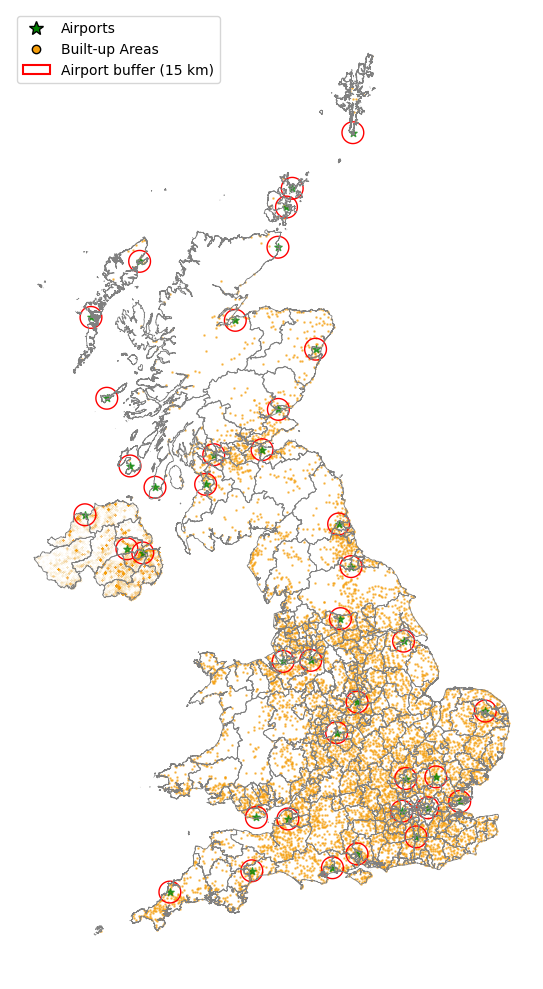

In [3]:


#using same coordinate reference system
north_ireland = gpd.read_file(north_ireland_file).to_crs(target_crs)

residential = gpd.GeoDataFrame(
    residential,
    geometry=gpd.points_from_xy(residential["LONG"], residential["LAT"]),
    crs="EPSG:4326"
).to_crs(target_crs)

airport_df = pd.read_csv(airport_boundary_path)
airport = gpd.GeoDataFrame(
    airport_df,
    geometry=gpd.points_from_xy(
        airport_df["longitude_deg"],
        airport_df["latitude_deg"]
    ),
    crs="EPSG:4326"
).to_crs(target_crs)

uk = gpd.read_file(uk_boundary_path).to_crs(target_crs)

north_ireland = gpd.clip(north_ireland, uk)
airport = gpd.clip(airport, uk)
airport["geom_point"] = airport.geometry
airport["geom_buf"] = airport["geom_point"].buffer(15000)

#plot diagrams
fig, ax = plt.subplots(figsize=(8, 10))
uk.plot(
    ax=ax,
    color ="white",
    edgecolor="none"
)


uk.boundary.plot(
    ax=ax,
    linewidth=0.6,
    color="grey",
    label="UK Boundary"
)

residential.plot(
    ax=ax,
    markersize=0.7,
    color="#f59e0b",
    alpha=0.6,
    label="Built-up Areas"
)

north_ireland.plot(
    ax=ax,
    markersize=0.03,
    color='#f59e0b',
    alpha=0.15,
)

airport.set_geometry("geom_buf").plot(
    ax=ax,
    facecolor="none",
    edgecolor="red",
    linewidth=1,
    alpha=1,
    label="Airports (15km buffer)"
)

airport.set_geometry("geom_point").plot(
    ax=ax,
    markersize=30,
    marker="*",
    color="green",
    alpha=0.7,
    label="Airports"
)
airport = airport.set_geometry("geom_point")


legend_elements = [
    Line2D([0], [0], marker="*", color="none", markerfacecolor="green",
           markersize=10, label="Airports"),
    Line2D(
        [0], [0],
        marker="o",
        color="none",
        markerfacecolor="#f59e0b",
        markersize=6,
        label="Built-up Areas"
    ),
    Patch(
        facecolor="none",
        edgecolor="red",
        linewidth=1.5,
        label="Airport buffer (15 km)"
    )
]

ax.legend(
    handles=legend_elements,
    loc="upper left",      
    frameon=True,
)

ax.set_axis_off()
plt.tight_layout()
plt.show()


/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:553: RuntimeWarning: invalid value encountered in unary_union
  return lib.unary_union(collections, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:100: RuntimeWarning: invalid value encountered in difference
  return lib.difference(a, b, **kwargs)


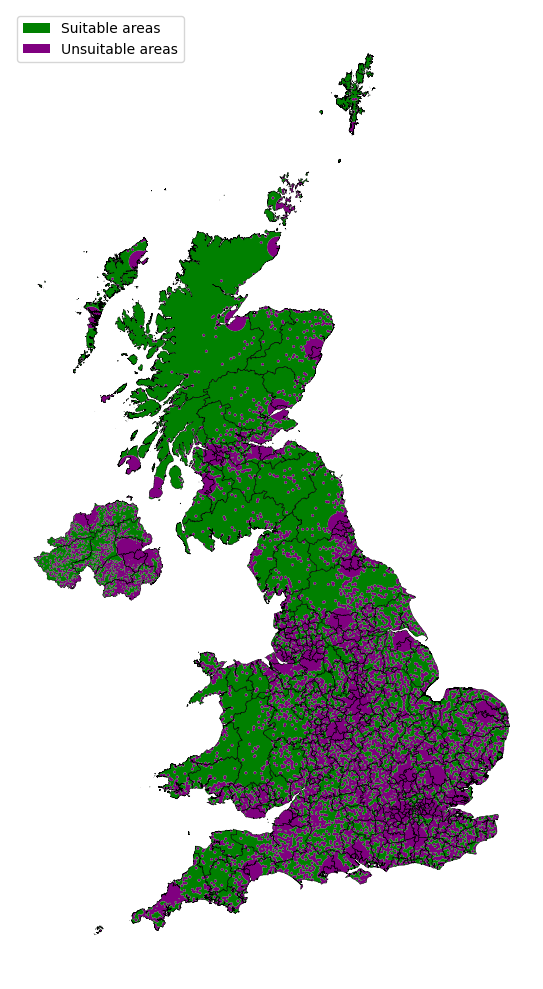

In [4]:
residential["geom_buf"] = residential.geometry.buffer(2000)
north_ireland["geom_buf"] = north_ireland.geometry.buffer(1000)
unsuitable = gpd.GeoDataFrame(
    geometry=pd.concat([
        residential["geom_buf"],
        airport["geom_buf"],
        north_ireland["geom_buf"]
    ], ignore_index=True),
    crs=target_crs
).dissolve()
unsuitable = gpd.clip(unsuitable, uk)
suitable = gpd.overlay(uk,unsuitable,how="difference")

fig, ax = plt.subplots(figsize=(8, 10))


unsuitable.plot(ax=ax,color="purple",edgecolor="none",label="Unsuitable areas")

suitable.plot(ax=ax,color="green", edgecolor="none",label="Suitable areas")

uk.boundary.plot(ax=ax,linewidth=0.3,color="black")
legend_elements = [
    Patch(facecolor="green", edgecolor="none", label="Suitable areas"),
    Patch(facecolor="purple", edgecolor="none", label="Unsuitable areas"),
]

ax.legend(
    handles=legend_elements,
    loc="upper left",  
    frameon=True,
)

ax.set_axis_off()
plt.tight_layout()
plt.show()


In [5]:
uk_boundary_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk boundary.geojson"
sac_scotland_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/SAC_SCOTLAND/SAC_SCOTLAND.shp"
sssi_england_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/SAC_ENG/SSSI_England.geojson'
sac_england_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/SAC_ENG/Special_Areas_of_Conservation_England.geojson'
spa_wales_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/features.json'
sac_northern_ireland_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/SAC_Ni/special-areas-of-conservation-updated NI.geojson'
spa_northern_ireland_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/SAC_Ni/SPA NI.geojson'
eng_AONB_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/outstanding/Areas_of_Outstanding_Natural_Beauty_England.geojson'
scotland_NSA_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/outstanding/SG_NationalScenicAreas_1998/SG_NationalScenicAreas_1998.shp'
wales_AONB_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/outstanding/NRW_AONB.csv'
northern_ireland_AONB_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/outstanding/aonb-ni.geojson'
northern_ireland_national_park_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/nationalpark/national park.geojson'
england_national_park_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/nationalpark/National_Parks_England.geojson'
scotland_national_park_path = '/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/nationalpark/National_Parks_scotland.geojson'

/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in inter

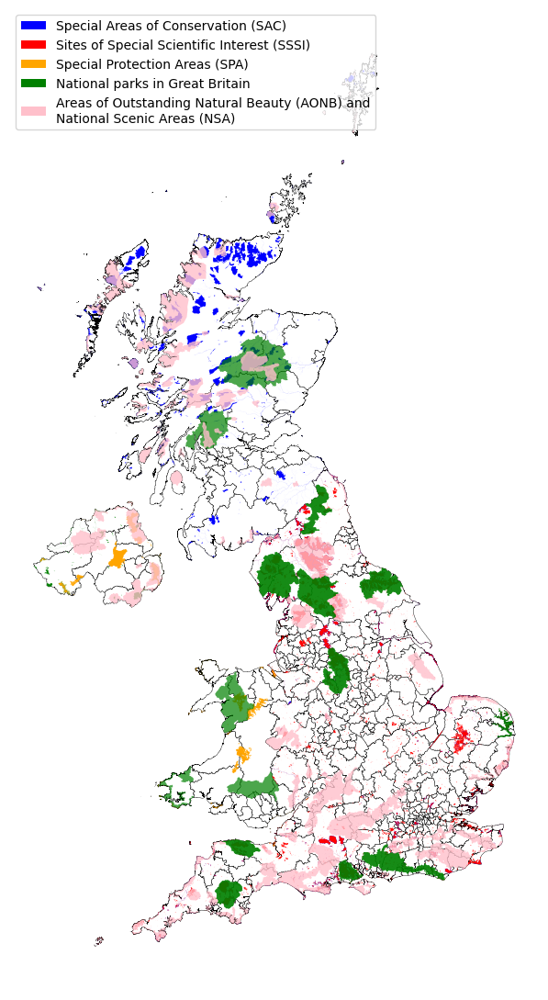

In [6]:

# protect area data
uk = gpd.read_file(uk_boundary_path).to_crs(target_crs)
sac_scotland = gpd.read_file(sac_scotland_path).to_crs(target_crs)
sac_england = gpd.read_file(sac_england_path).to_crs(target_crs)
sssi_england = gpd.read_file(sssi_england_path).to_crs(target_crs)
spa_wales = gpd.read_file(spa_wales_path).to_crs(target_crs)
sac_northern_ireland = gpd.read_file(sac_northern_ireland_path).to_crs(target_crs)
spa_northern_ireland = gpd.read_file(spa_northern_ireland_path).to_crs(target_crs)


# national park and outstanding beauty area data
NI_national_park = gpd.read_file(northern_ireland_national_park_path).to_crs(target_crs)
ENG_national_park = gpd.read_file(england_national_park_path).to_crs(target_crs)
scotland_national_park = gpd.read_file(scotland_national_park_path).to_crs(target_crs)
eng_AONB = gpd.read_file(eng_AONB_path).to_crs(target_crs)
scotland_NSA = gpd.read_file(scotland_NSA_path).to_crs(target_crs)
wales_AONB_df = pd.read_csv(wales_AONB_path)
wales_AONB = gpd.GeoDataFrame(
    wales_AONB_df,
    geometry=gpd.points_from_xy(wales_AONB_df["Centre_X"], wales_AONB_df["Centre_Y"]),
    crs="EPSG:4326"
).to_crs(target_crs)
def safe_make_valid(gdf):
    gdf = gdf.copy()
    gdf = gdf[gdf.geometry.notna()]

    geom_types = set(gdf.geometry.geom_type.unique())
    if geom_types.issubset({"Point", "MultiPoint"}):
        return gdf  

    gdf["geometry"] = gdf.geometry.make_valid()
    gdf = gdf[gdf.geometry.notna()]
    return gdf
northern_ireland_AONB = gpd.read_file(northern_ireland_AONB_path).to_crs(target_crs)


uk["geometry"] = uk.geometry.make_valid()
sac_scotland["geometry"] = sac_scotland.geometry.make_valid()
sac_england["geometry"]  = sac_england.geometry.make_valid()
sac_northern_ireland["geometry"]  = sac_northern_ireland.geometry.make_valid()
spa_northern_ireland["geometry"]  = spa_northern_ireland.geometry.make_valid()
spa_wales["geometry"]  = spa_wales.geometry.make_valid()
sssi_england["geometry"]  = sssi_england.geometry.make_valid()

NI_national_park["geometry"]  = NI_national_park.geometry.make_valid()
ENG_national_park["geometry"]  = ENG_national_park.geometry.make_valid()
scotland_national_park["geometry"]  = scotland_national_park.geometry.make_valid()
eng_AONB["geometry"]  = eng_AONB.geometry.make_valid()
scotland_NSA["geometry"]  = scotland_NSA.geometry.make_valid()
northern_ireland_AONB["geometry"]  = northern_ireland_AONB.geometry.make_valid()


#clip to uk boundary
sac_scotland = gpd.clip(sac_scotland, uk)
sac_england = gpd.clip(sac_england, uk)
sac_northern_ireland = gpd.clip(sac_northern_ireland, uk)
spa_northern_ireland = gpd.clip(spa_northern_ireland, uk)
spa_wales = gpd.clip(spa_wales, uk)
sssi_england = gpd.clip(sssi_england, uk)

NI_national_park = gpd.clip(NI_national_park, uk)
ENG_national_park = gpd.clip(ENG_national_park, uk)
scotland_national_park = gpd.clip(scotland_national_park, uk)
eng_AONB = gpd.clip(eng_AONB, uk)
scotland_NSA = gpd.clip(scotland_NSA, uk)
wales_AONB = gpd.clip(wales_AONB, uk)
northern_ireland_AONB = gpd.clip(northern_ireland_AONB, uk)

#protect area plotting
fig, ax = plt.subplots(figsize=(9, 11))
uk.plot(ax=ax, color="white", edgecolor="black", linewidth=0.3)
sac_scotland.plot(ax=ax, color="blue", edgecolor="none", alpha=1)
sac_england.plot(ax=ax, color="blue", edgecolor="none", alpha=1)
sac_northern_ireland.plot(ax=ax, color="green", edgecolor="none", alpha=1)
sssi_england.plot(ax=ax, color="red", edgecolor="none", alpha=1)
spa_wales.plot(ax=ax, color="orange", edgecolor="none", alpha=1)
spa_northern_ireland.plot(ax=ax, color="orange", edgecolor="none", alpha=1)

#national park and outstanding beauty area plotting
ENG_national_park.plot(ax=ax, color="green", edgecolor="none", alpha=0.7)
scotland_national_park.plot(ax=ax, color="green", edgecolor="none", alpha=0.7)
NI_national_park.plot(ax=ax, color="green", edgecolor="none", alpha=0.7)
eng_AONB.plot(ax=ax, color="pink", edgecolor="none", alpha=0.8)
scotland_NSA.plot(ax=ax, color="pink", edgecolor="none", alpha=0.8)
wales_AONB.plot(ax=ax, color="pink", edgecolor="none", alpha=0.8)
northern_ireland_AONB.plot(ax=ax, color="pink", edgecolor="none", alpha=0.8)

legend_elements = [
    Patch(facecolor="blue",  edgecolor="none", label="Special Areas of Conservation (SAC)"),
    Patch(facecolor="red",    edgecolor="none", label="Sites of Special Scientific Interest (SSSI)"),
    Patch(facecolor="orange", edgecolor="none", label="Special Protection Areas (SPA)"),
    Patch(facecolor="green", edgecolor="none", label="National parks in Great Britain"),
    Patch(facecolor="pink", edgecolor="none", label="Areas of Outstanding Natural Beauty (AONB) and\nNational Scenic Areas (NSA)"),
]

ax.legend(
    handles=legend_elements,
    loc="upper left",      
    frameon=True,
)

ax.set_axis_off()
plt.tight_layout()
plt.show()

/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:553: RuntimeWarning: invalid value encountered in unary_union
  return lib.unary_union(collections, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:100: RuntimeWarning: invalid value encountered in difference
  return lib.difference(a, b, **kwargs)


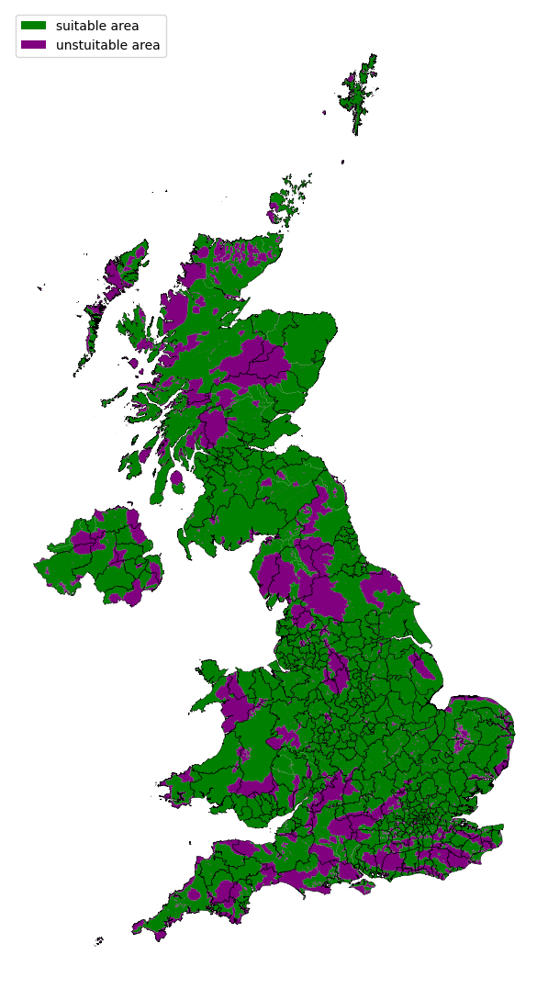

In [7]:
protected_areas = gpd.GeoDataFrame(
    geometry=pd.concat([
        sac_scotland.geometry,
        sac_england.geometry,
        sac_northern_ireland.geometry,
        sssi_england.geometry,
        spa_wales.geometry,
        spa_northern_ireland.geometry,
        NI_national_park.geometry,
        ENG_national_park.geometry,
        scotland_national_park.geometry,
        eng_AONB.geometry,
        scotland_NSA.geometry,
        wales_AONB.geometry,
        northern_ireland_AONB.geometry,
    ], ignore_index=True),
    crs=uk.crs
)
protected_union = protected_areas.dissolve()

available_land = gpd.overlay(
    uk,
    protected_union,
    how="difference"
)

fig, ax = plt.subplots(figsize=(9, 11))
available_land.plot(ax=ax, color="green", edgecolor="none")
protected_union.plot(ax=ax,color="purple", edgecolor="none")
uk.boundary.plot(ax=ax,color="black",linewidth=0.3)
legend_elements = [
    Patch(facecolor="green",  edgecolor="none", label="suitable area"),
    Patch(facecolor="purple",    edgecolor="none", label="unstuitable area"),
 
]

ax.legend(handles=legend_elements,loc="upper left",frameon=True)

ax.set_axis_off()
plt.tight_layout()
plt.show()

In [8]:
NI_lake_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/NI lake.geojson"
NI_river_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/NI river.geojson"
GB_lake_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/GB lake.geojson"
GB_river_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/GB river.geojson"
scotland_lake_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/Scotland lake.geojson"
scotland_river_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/Scotland river.geojson"
Wales_lake_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/Wales lake.json"
Wales_river_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/hydrology/Wales river.json"

/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in inter

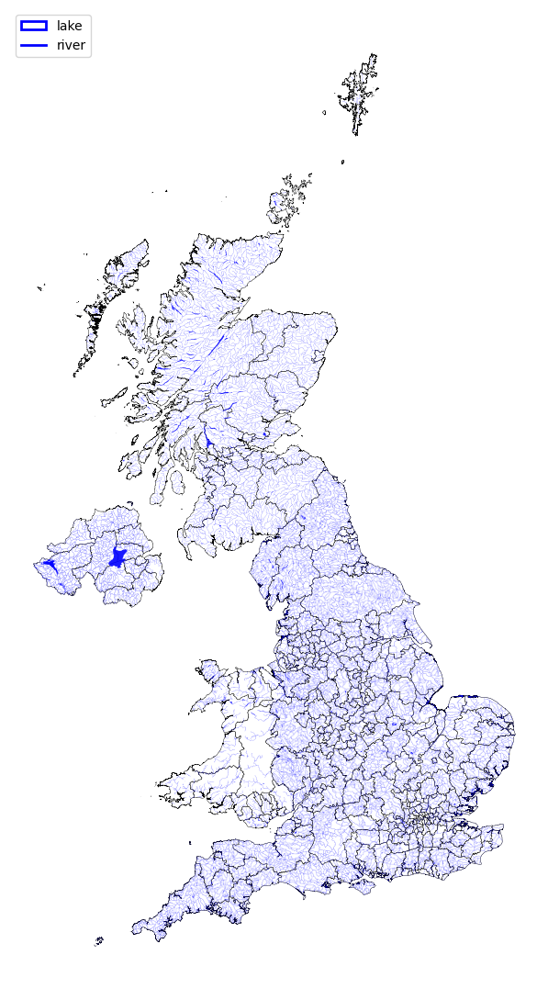

In [9]:
uk = gpd.read_file(uk_boundary_path).to_crs(target_crs)
NI_lake = gpd.read_file(NI_lake_path).to_crs(target_crs)
NI_river = gpd.read_file(NI_river_path).to_crs(target_crs)
GB_lake = gpd.read_file(GB_lake_path).to_crs(target_crs)
GB_river = gpd.read_file(GB_river_path).to_crs(target_crs)
scotland_lake = gpd.read_file(scotland_lake_path).to_crs(target_crs)
scotland_river = gpd.read_file(scotland_river_path).to_crs(target_crs)
Wales_lake = gpd.read_file(Wales_lake_path).to_crs(target_crs)
Wales_river = gpd.read_file(Wales_river_path).to_crs(target_crs)

uk["geometry"] = uk.geometry.make_valid()
NI_lake["geometry"] = NI_lake.geometry.make_valid()
GB_lake["geometry"] = GB_lake.geometry.make_valid()
scotland_lake["geometry"] = scotland_lake.geometry.make_valid()
Wales_lake["geometry"] = Wales_lake.geometry.make_valid()


NI_lake = gpd.clip(NI_lake, uk)
NI_river = gpd.clip(NI_river, uk)
GB_lake = gpd.clip(GB_lake, uk)
GB_river = gpd.clip(GB_river, uk)
scotland_lake = gpd.clip(scotland_lake, uk)
scotland_river = gpd.clip(scotland_river, uk)
Wales_lake = gpd.clip(Wales_lake, uk)
Wales_river = gpd.clip(Wales_river, uk)


fig, ax = plt.subplots(figsize=(9, 11))
uk.plot(ax=ax, color="white", edgecolor="black", linewidth=0.3)
NI_lake.plot(ax=ax, color="blue", edgecolor="none", alpha=0.9)
NI_river.plot(ax=ax, facecolor="none",linewidth=0.07,edgecolor="blue", alpha=0.7)
GB_lake.plot(ax=ax, color="blue", edgecolor="none", alpha=0.9)
GB_river.plot(ax=ax, facecolor="none",linewidth=0.07,edgecolor="blue", alpha=0.7)
scotland_lake.plot(ax=ax, color="blue", edgecolor="none", alpha=0.9)
scotland_river.plot(ax=ax, facecolor="none",linewidth=0.1,edgecolor="blue", alpha=0.9)
Wales_lake.plot(ax=ax, color="blue", edgecolor="none", alpha=0.9)
Wales_river.plot(ax=ax, facecolor="none",linewidth=0.1,edgecolor="blue", alpha=0.9)


legend_elements = [
    Patch(facecolor="none", edgecolor="blue", linewidth=2, label="lake"),
    Line2D([0], [0], color="blue", linewidth=2, label="river"),
]

ax.legend(
    handles=legend_elements,
    loc="upper left",
    frameon=True
)


ax.set_axis_off()
plt.tight_layout()
plt.show()

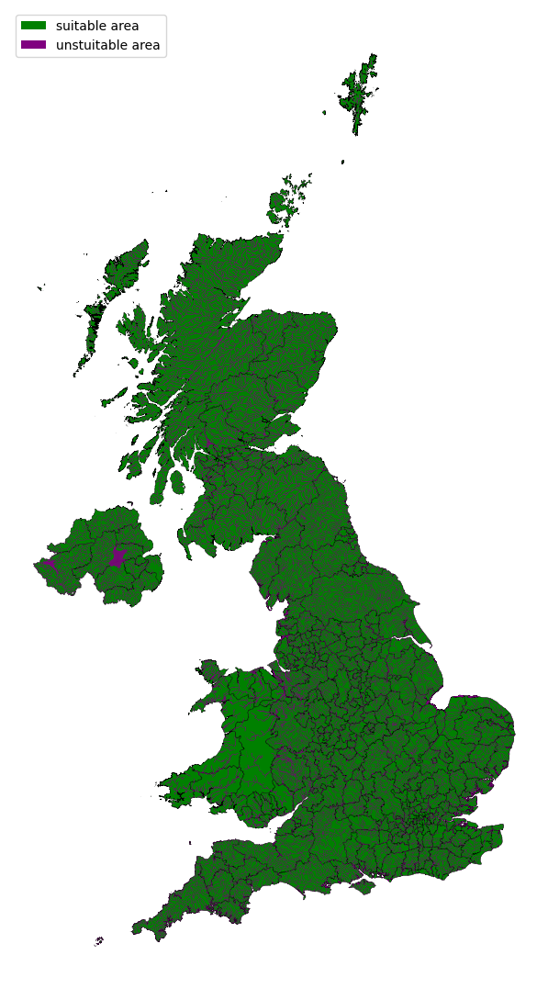

In [10]:
fig, ax = plt.subplots(figsize=(9, 11))

# green background for all land
uk.plot(ax=ax, color="green", edgecolor="black", linewidth=0.3)

# lakes (polygons) in purple
NI_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9)
GB_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9)
scotland_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9)
Wales_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9)

# rivers (lines) in purple
NI_river.plot(ax=ax, facecolor="none", linewidth=0.1, edgecolor="purple", alpha=1, zorder=2)
GB_river.plot(ax=ax, facecolor="none", linewidth=0.1, edgecolor="purple", alpha=1, zorder=2)
scotland_river.plot(ax=ax, facecolor="none", linewidth=0.3, edgecolor="purple", alpha=1, zorder=2)
Wales_river.plot(ax=ax, facecolor="none", linewidth=0.3, edgecolor="purple", alpha=1, zorder=2)

legend_elements = [
    Patch(facecolor="green",  edgecolor="none", label="suitable area"),
    Patch(facecolor="purple",    edgecolor="none", label="unstuitable area"),
 
]

ax.legend(
    handles=legend_elements,
    loc="upper left",      
    frameon=True
)

ax.set_axis_off()
plt.tight_layout()
plt.show()




/opt/anaconda3/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 3993385 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(
/opt/anaconda3/lib/python3.13/site-packages/shapely/set_operations.py:168: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


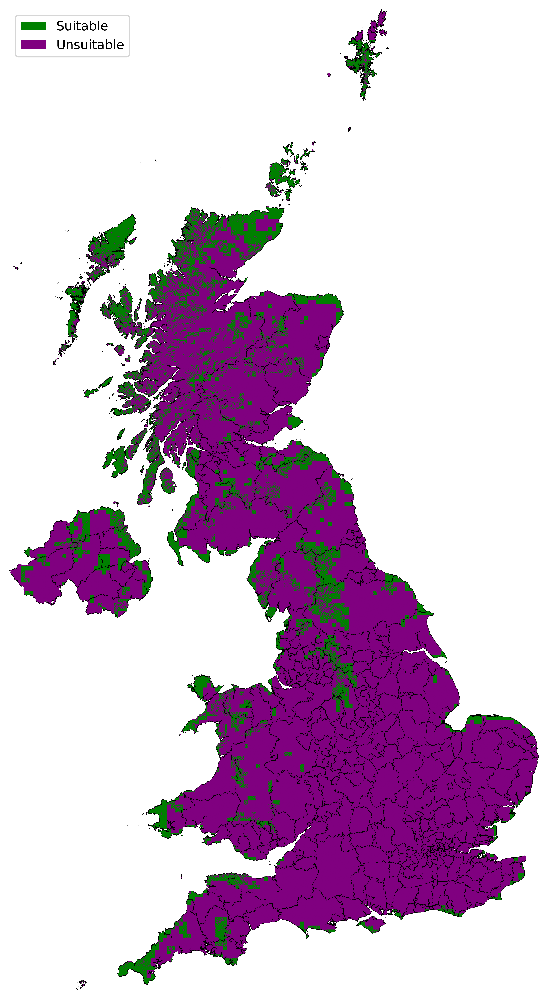

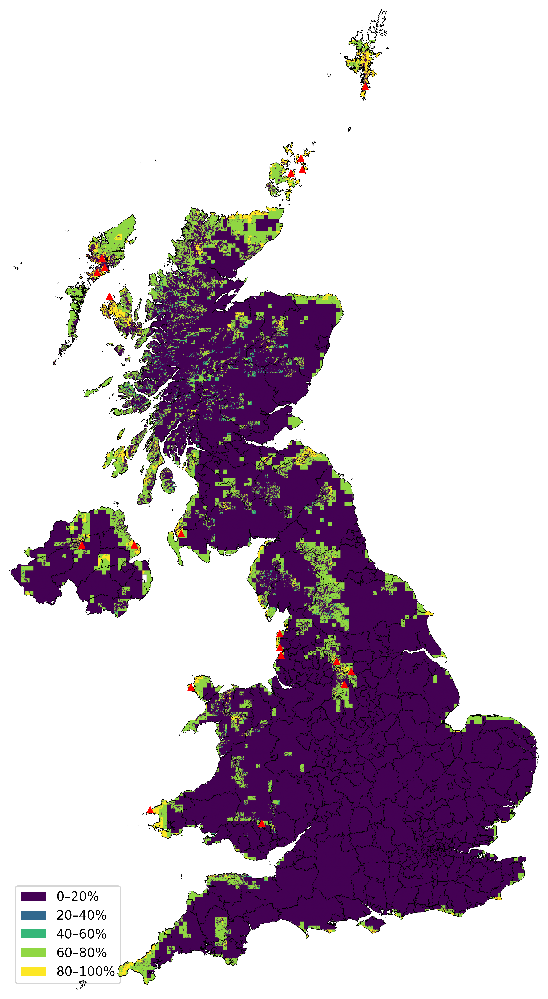

In [ ]:
import numpy as np
import geopandas as gpd
import rasterio
import rasterio.mask
import xarray as xr
import matplotlib.pyplot as plt

from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap, BoundaryNorm
from rasterio.features import rasterize
from rasterio.warp import reproject, Resampling
from pyproj import CRS
import pyproj

from scipy.ndimage import distance_transform_edt


uk_boundary_27700_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_boundary_27700.geojson"
dem_tif_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_dem_clipped_UK_EPSG27700.tif"
nc_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/wind_speed.nc"
capacity_tif_27700 = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/GBR_capacity-factor_IEC1_EPSG27700.tif"
powerdensity_tif_27700 = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/GBR_power-density_100m_EPSG27700.tif"
lines_path_27700 = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_transmission_lines_EPSG27700.geojson"

thr_wind = 4.5
thr_cf = 0.30
thr_pd = 400.0
thr_slope = 15.0
thr_alt = 600.0


def safe_crs(crs_like, fallback="EPSG:27700"):
    try:
        if crs_like is None:
            return CRS.from_user_input(fallback)
        return CRS.from_user_input(crs_like)
    except Exception:
        return CRS.from_user_input(fallback)


def ensure_crs(gdf, target_crs, assume_if_none="EPSG:27700"):
    if gdf is None:
        return None
    gdf = gdf.copy()
    tgt = safe_crs(target_crs)
    if gdf.crs is None:
        return gdf.set_crs(tgt, allow_override=True)
    src = safe_crs(gdf.crs, fallback=assume_if_none)
    if src == tgt:
        return gdf
    try:
        return gdf.to_crs(tgt)
    except pyproj.exceptions.ProjError:
        return gdf.set_crs(tgt, allow_override=True)


uk = gpd.read_file(uk_boundary_27700_path)
uk["geometry"] = uk.geometry.make_valid()
uk = uk[uk.geometry.notna() & ~uk.geometry.is_empty]
uk = uk.set_crs("EPSG:27700", allow_override=True)
uk_union = uk.union_all() if hasattr(uk, "union_all") else uk.unary_union

with rasterio.open(dem_tif_path) as src:
    dem_arr, tr = rasterio.mask.mask(src, [uk_union], crop=True, filled=True, nodata=np.nan)
    dem = dem_arr[0].astype("float32")
    if src.nodata is not None:
        dem = np.where(dem == src.nodata, np.nan, dem)
    ref_crs = safe_crs(src.crs)

h, w = dem.shape
left, top = tr * (0, 0)
right, bottom = tr * (w, h)
extent = (left, right, bottom, top)

dx = abs(tr.a)
dy = abs(tr.e)

dz_dy, dz_dx = np.gradient(dem, dy, dx)
slope_pct = np.sqrt(dz_dx**2 + dz_dy**2) * 100.0
slope_ok = np.isfinite(slope_pct) & (slope_pct <= thr_slope)
alt_ok = np.isfinite(dem) & (dem <= thr_alt)

x_centers = left + dx * (np.arange(w) + 0.5)
y_centers = top - dy * (np.arange(h) + 0.5)

ds = xr.open_dataset(nc_path)
da = ds["wind_speed"].mean(dim="season", skipna=True)
wind_on_ref = da.interp(x=x_centers, y=y_centers, method="nearest").values
wind_ok = np.isfinite(wind_on_ref) & (wind_on_ref > thr_wind)


def align_to_dem_grid(tif_path, resampling=Resampling.bilinear):
    with rasterio.open(tif_path) as src:
        src_arr = src.read(1).astype("float32")
        if src.nodata is not None:
            src_arr = np.where(src_arr == src.nodata, np.nan, src_arr)

        if safe_crs(src.crs) != ref_crs:
            raise ValueError(f"Raster CRS mismatch: {tif_path}")

        dst = np.full((h, w), np.nan, dtype="float32")

        reproject(
            source=src_arr,
            destination=dst,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=tr,
            dst_crs=ref_crs,
            resampling=resampling,
            src_nodata=np.nan,
            dst_nodata=np.nan,
        )
        return dst


cf = align_to_dem_grid(capacity_tif_27700, resampling=Resampling.bilinear)
pd_arr = align_to_dem_grid(powerdensity_tif_27700, resampling=Resampling.bilinear)

cf_ok = np.isfinite(cf) & (cf >= thr_cf)
pd_ok = np.isfinite(pd_arr) & (pd_arr > thr_pd)

lines = gpd.read_file(lines_path_27700)
lines["geometry"] = lines.geometry.make_valid()
lines = lines[lines.geometry.notna() & ~lines.geometry.is_empty]
lines = lines.set_crs("EPSG:27700", allow_override=True)
lines = ensure_crs(lines, ref_crs)
uk = ensure_crs(uk, ref_crs)
lines = gpd.clip(lines, uk)

line_mask = rasterize(
    [(geom, 1) for geom in lines.geometry],
    out_shape=(h, w),
    transform=tr,
    fill=0,
    dtype="uint8"
).astype(bool)

valid = np.isfinite(dem)
suitable_bool = valid & wind_ok & cf_ok & pd_ok & slope_ok & alt_ok & (~line_mask)

final = np.where(valid, suitable_bool.astype(np.uint8), np.nan)
final = np.ma.masked_invalid(final)

cmap_bin = ListedColormap(["purple", "green"])
cmap_bin.set_bad(alpha=0)


fig, ax = plt.subplots(figsize=(9, 11), dpi=600)

uk.plot(ax=ax, color="green", edgecolor="black", linewidth=0.3, zorder=1)

NI_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9, zorder=2)
GB_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9, zorder=2)
scotland_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9, zorder=2)
Wales_lake.plot(ax=ax, color="purple", edgecolor="none", alpha=0.9, zorder=2)

NI_river.plot(ax=ax, facecolor="none", linewidth=0.1, edgecolor="purple", alpha=1, zorder=2)
GB_river.plot(ax=ax, facecolor="none", linewidth=0.1, edgecolor="purple", alpha=1, zorder=2)
scotland_river.plot(ax=ax, facecolor="none", linewidth=0.3, edgecolor="purple", alpha=1, zorder=2)
Wales_river.plot(ax=ax, facecolor="none", linewidth=0.3, edgecolor="purple", alpha=1, zorder=2)

available_land.plot(ax=ax, color="green", edgecolor="none", zorder=3)
protected_union.plot(ax=ax, color="purple", edgecolor="none", zorder=4)

ax.imshow(final, extent=extent, origin="upper", cmap=cmap_bin, vmin=0, vmax=1, zorder=999)
uk.boundary.plot(ax=ax, color="black", linewidth=0.3, zorder=1000)

ax.legend(
    handles=[
        Patch(facecolor="green", edgecolor="none", label="Suitable"),
        Patch(facecolor="purple", edgecolor="none", label="Unsuitable"),
    ],
    loc="upper left",
    frameon=True
)

ax.set_axis_off()
plt.tight_layout()
plt.show()


from shapely.geometry import box

def raster_mask_from_geom(geom, out_shape, transform):
    m = rasterize(
        [(geom, 1)],
        out_shape=out_shape,
        transform=transform,
        fill=0,
        dtype="uint8"
    )
    return m.astype(bool)

def try_get_ni_geom_from_uk(uk_gdf):
    cols = [c for c in uk_gdf.columns if c != "geometry"]
    key_cols = [c for c in cols if any(k in c.lower() for k in ["name", "country", "admin", "region", "ctry"])]
    for c in key_cols + cols:
        s = uk_gdf[c].astype(str).str.lower()
        hit = s.str.contains("northern ireland").fillna(False)
        if hit.any():
            return uk_gdf.loc[hit].union_all() if hasattr(uk_gdf.loc[hit], "union_all") else uk_gdf.loc[hit].unary_union
    return None

def pick_top_sites_masked(index_100_arr, eligible_mask, tr, n_sites, min_dist_m, pool_size=300000, already_xy=None):
    idx = np.array(index_100_arr, dtype="float32")
    ok = np.isfinite(idx) & eligible_mask
    if not np.any(ok):
        return [], (already_xy if already_xy is not None else [])

    rows, cols = np.where(ok)
    vals = idx[rows, cols]

    order = np.argsort(vals)[::-1]
    if pool_size is not None and len(order) > pool_size:
        order = order[:pool_size]

    rows = rows[order]
    cols = cols[order]
    vals = vals[order]

    dx = abs(tr.a)
    dy = abs(tr.e)
    x0 = tr.c
    y0 = tr.f

    xs = x0 + dx * (cols + 0.5)
    ys = y0 - dy * (rows + 0.5)

    chosen = []
    chosen_xy = [] if already_xy is None else list(already_xy)
    min_d2 = float(min_dist_m) ** 2

    for x, y, v in zip(xs, ys, vals):
        if len(chosen) >= n_sites:
            break

        keep = True
        for cx, cy in chosen_xy:
            if (x - cx) ** 2 + (y - cy) ** 2 < min_d2:
                keep = False
                break

        if keep:
            chosen.append((float(x), float(y), float(v)))
            chosen_xy.append((float(x), float(y)))

    return chosen, chosen_xy


n_ni = 4
n_mid = 6
n_total = 20
min_dist_m = 10000.0


ni_geom = try_get_ni_geom_from_uk(uk)
if ni_geom is None:
   
    ni_geom = box(80000, 430000, 360000, 620000)

ni_mask = raster_mask_from_geom(ni_geom, (h, w), tr)


mid_geom = box(300000, 200000, 520000, 450000)
mid_mask = raster_mask_from_geom(mid_geom, (h, w), tr)


eligible_all = suitable_bool & np.isfinite(idx_nan)

eligible_ni  = eligible_all & ni_mask
eligible_mid = eligible_all & mid_mask
eligible_rest = eligible_all & (~ni_mask) & (~mid_mask)


sites = []
xy = []

ni_sites, xy = pick_top_sites_masked(idx_nan, eligible_ni, tr, n_ni,  min_dist_m, already_xy=xy)
sites += ni_sites

mid_sites, xy = pick_top_sites_masked(idx_nan, eligible_mid, tr, n_mid, min_dist_m, already_xy=xy)
sites += mid_sites

remaining = n_total - len(sites)
rest_sites, xy = pick_top_sites_masked(idx_nan, eligible_rest, tr, remaining, min_dist_m, already_xy=xy)
sites += rest_sites


if len(sites) < n_total:
    remaining2 = n_total - len(sites)
    all_sites, xy = pick_top_sites_masked(idx_nan, eligible_all, tr, remaining2, min_dist_m * 0.6, already_xy=xy)
    sites += all_sites

xs = [s[0] for s in sites]
ys = [s[1] for s in sites]

fig2, ax2 = plt.subplots(figsize=(9, 11), dpi=600)

ax2.imshow(cls, extent=extent, origin="upper", cmap=cmap_idx, norm=norm, zorder=10)
uk.boundary.plot(ax=ax2, color="black", linewidth=0.3, zorder=20)

ax2.scatter(
    xs, ys,
    marker="^",
    s=25,
    c="red",
    edgecolors="red",
    linewidths=0.6,
    zorder=9999
)

legend_elements = [
    Patch(facecolor=colors[0], edgecolor="none", label="0–20%"),
    Patch(facecolor=colors[1], edgecolor="none", label="20–40%"),
    Patch(facecolor=colors[2], edgecolor="none", label="40–60%"),
    Patch(facecolor=colors[3], edgecolor="none", label="60–80%"),
    Patch(facecolor=colors[4], edgecolor="none", label="80–100%"),
]
ax2.legend(handles=legend_elements, loc="lower left", frameon=True)

ax2.set_axis_off()
plt.tight_layout()
plt.show()





/opt/anaconda3/lib/python3.13/site-packages/pyogrio/raw.py:198: RuntimeWarning: Several features with id = 3993385 have been found. Altering it to be unique. This warning will not be emitted anymore for this layer
  return ogr_read(
ERROR 1: PROJ: internal_proj_identify: /opt/anaconda3/share/proj/proj.db contains DATABASE.LAYOUT.VERSION.MINOR = 2 whereas a number >= 3 is expected. It comes from another PROJ installation.


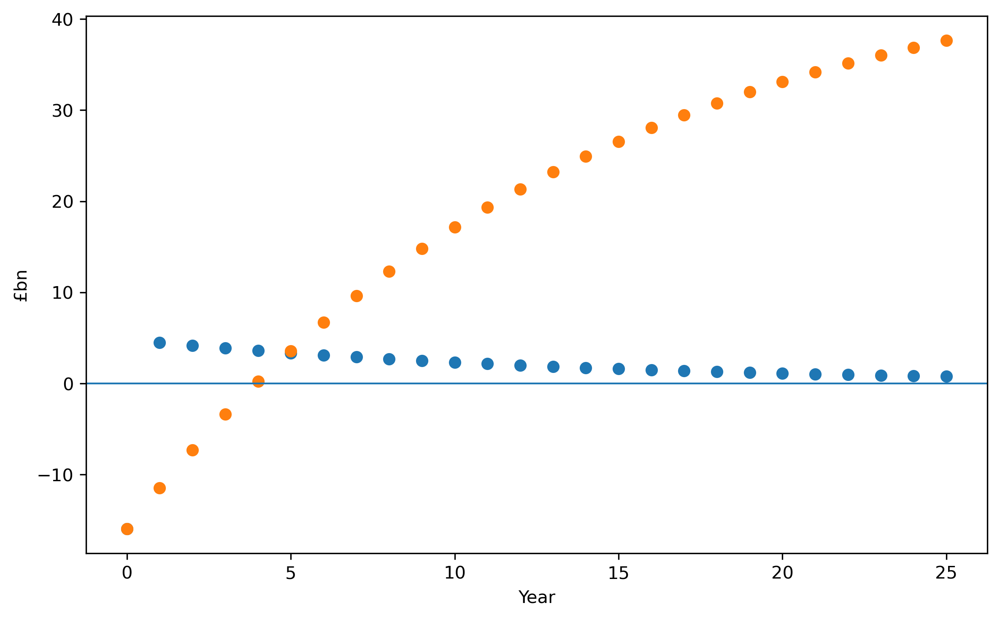

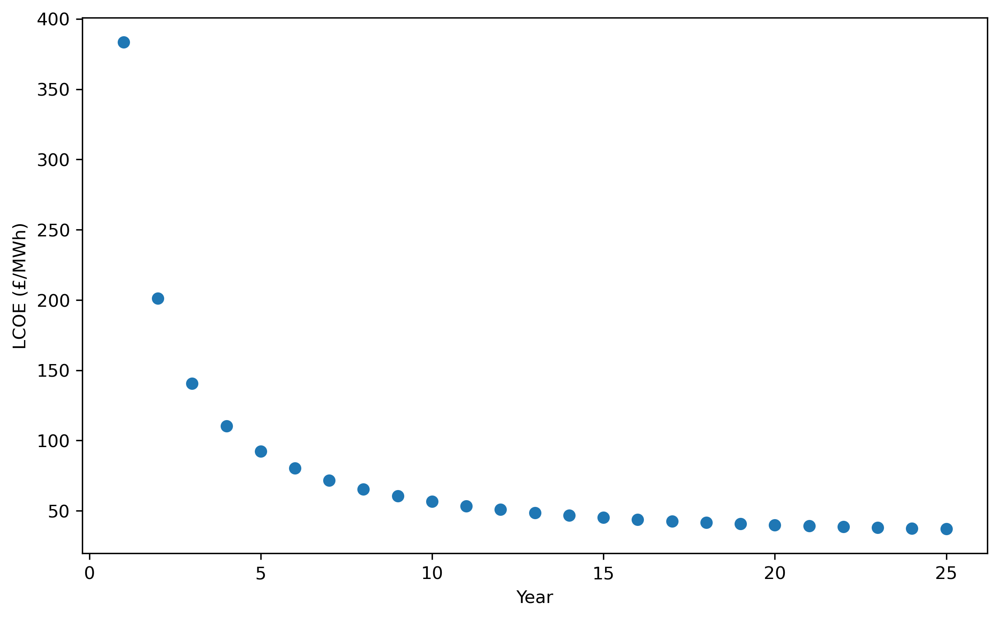

In [37]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
import rasterio.mask
from rasterio.features import rasterize
from rasterio.warp import reproject, Resampling
from rasterio.crs import CRS
from scipy.ndimage import distance_transform_edt

def align_to_dem_grid(tif_path, ref_crs, tr, out_shape, resampling=Resampling.bilinear):
    h, w = out_shape
    with rasterio.open(tif_path) as src:
        arr = src.read(1).astype("float32")
        if src.nodata is not None:
            arr = np.where(arr == src.nodata, np.nan, arr)
        if src.crs is None:
            raise ValueError(f"Missing CRS in raster: {tif_path}")
        if str(src.crs) != str(ref_crs):
            raise ValueError(f"CRS mismatch for {tif_path}. Need {ref_crs}, got {src.crs}")
        dst = np.full((h, w), np.nan, dtype="float32")
        reproject(
            source=arr,
            destination=dst,
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=tr,
            dst_crs=ref_crs,
            resampling=resampling,
            src_nodata=np.nan,
            dst_nodata=np.nan,
        )
        return dst

def points_to_rc(points_xy, transform):
    rows, cols = [], []
    for x, y in points_xy:
        r, c = rasterio.transform.rowcol(transform, x, y)
        rows.append(r)
        cols.append(c)
    return np.array(rows, dtype=int), np.array(cols, dtype=int)

def clamp_rc(rows, cols, h, w):
    return np.clip(rows, 0, h - 1), np.clip(cols, 0, w - 1)

def build_distance_to_grid_m(lines_gdf, tr, out_shape, dx, dy):
    h, w = out_shape
    line_mask = rasterize(
        [(geom, 1) for geom in lines_gdf.geometry],
        out_shape=(h, w),
        transform=tr,
        fill=0,
        dtype="uint8"
    ).astype(bool)
    return distance_transform_edt(~line_mask, sampling=(dy, dx)).astype("float32")

def npv_from_series(capex0, annual_revenue, annual_opex, discount_rate, lifetime_years, degradation=0.0):
    years = np.arange(1, lifetime_years + 1, dtype="float64")
    energy_multiplier = (1.0 - degradation) ** (years - 1.0)
    cash = (annual_revenue * energy_multiplier) - annual_opex
    disc = (1.0 + discount_rate) ** years
    return -capex0 + np.sum(cash / disc)

def lcoe_from_series(capex0, annual_energy_mwh, annual_opex, discount_rate, lifetime_years, degradation=0.0):
    years = np.arange(1, lifetime_years + 1, dtype="float64")
    energy_multiplier = (1.0 - degradation) ** (years - 1.0)
    disc = (1.0 + discount_rate) ** years
    pv_cost = capex0 + np.sum(annual_opex / disc)
    pv_energy = np.sum((annual_energy_mwh * energy_multiplier) / disc)
    return pv_cost / pv_energy

def compute_financials_table(
    sites_xy,
    cf_grid,
    dist_m_grid,
    tr,
    installed_capacity_mw,
    capex_install_gbp_per_kw,
    connection_cost_gbp_per_km,
    opex_gbp_per_mw_year,
    prices_gbp_per_mwh_series,
    lifetime_years=25,
    discount_rate=0.07,
    degradation=0.005
):
    h, w = cf_grid.shape
    rows, cols = points_to_rc(sites_xy, tr)
    rows, cols = clamp_rc(rows, cols, h, w)

    cf_vals = cf_grid[rows, cols].astype("float64")
    dist_km_vals = (dist_m_grid[rows, cols].astype("float64")) / 1000.0

    avg_price = float(np.mean(prices_gbp_per_mwh_series))

    annual_energy_mwh = installed_capacity_mw * 8760.0 * cf_vals
    yearly_revenue_gbp = annual_energy_mwh * avg_price

    capex_install_gbp = installed_capacity_mw * 1000.0 * capex_install_gbp_per_kw
    capex_connection_gbp = dist_km_vals * connection_cost_gbp_per_km
    capex_total_gbp = capex_install_gbp + capex_connection_gbp

    annual_opex_gbp = installed_capacity_mw * opex_gbp_per_mw_year

    npv_vals = np.array([
        npv_from_series(
            capex0=float(capex_total_gbp[i]),
            annual_revenue=float(yearly_revenue_gbp[i]),
            annual_opex=float(annual_opex_gbp),
            discount_rate=discount_rate,
            lifetime_years=lifetime_years,
            degradation=degradation
        )
        for i in range(len(sites_xy))
    ], dtype="float64")

    lcoe_vals = np.array([
        lcoe_from_series(
            capex0=float(capex_total_gbp[i]),
            annual_energy_mwh=float(annual_energy_mwh[i]),
            annual_opex=float(annual_opex_gbp),
            discount_rate=discount_rate,
            lifetime_years=lifetime_years,
            degradation=degradation
        )
        for i in range(len(sites_xy))
    ], dtype="float64")

    df = pd.DataFrame({
        "site_id": [f"Farm_{i+1:02d}" for i in range(len(sites_xy))],
        "x": [p[0] for p in sites_xy],
        "y": [p[1] for p in sites_xy],
        "capacity_mw": installed_capacity_mw,
        "capacity_factor": cf_vals,
        "dist_to_grid_km": dist_km_vals,
        "capex_total_gbp": capex_total_gbp,
        "annual_opex_gbp": annual_opex_gbp,
        "yearly_revenue_gbp": yearly_revenue_gbp,
        "npv_gbp": npv_vals,
        "lcoe_gbp_per_mwh": lcoe_vals
    })

    return df

uk_boundary_27700_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_boundary_27700.geojson"
dem_tif_path = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_dem_clipped_UK_EPSG27700.tif"
capacity_tif_27700 = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/GBR_capacity-factor_IEC1_EPSG27700.tif"
lines_path_27700 = "/Users/lct/Desktop/0093/cw2/2nd_Assignment-20251218 2/datasets/uk_transmission_lines_EPSG27700.geojson"

installed_capacity_mw = 500.0
capex_install_gbp_per_kw = 1588.0
connection_cost_gbp_per_km = 1_600_000.0
opex_gbp_per_mw_year = 23_100.0

prices_gbp_per_mwh_series = [
    207.07, 128.81,
    80.52,  86.02,
    83.50,  84.75
]

lifetime_years = 25
discount_rate = 0.07
degradation = 0.005

uk = gpd.read_file(uk_boundary_27700_path)
uk["geometry"] = uk.geometry.make_valid()
uk = uk[uk.geometry.notna() & ~uk.geometry.is_empty]
uk = uk.set_crs("EPSG:27700", allow_override=True)
uk_union = uk.union_all() if hasattr(uk, "union_all") else uk.unary_union

with rasterio.open(dem_tif_path) as src:
    dem_arr, tr = rasterio.mask.mask(src, [uk_union], crop=True, filled=True, nodata=np.nan)
    dem = dem_arr[0].astype("float32")
    if src.nodata is not None:
        dem = np.where(dem == src.nodata, np.nan, dem)
    ref_crs = src.crs

if ref_crs is None:
    ref_crs = CRS.from_epsg(27700)

h, w = dem.shape
dx = abs(tr.a)
dy = abs(tr.e)

cf_grid = align_to_dem_grid(capacity_tif_27700, ref_crs, tr, (h, w), resampling=Resampling.bilinear)

lines = gpd.read_file(lines_path_27700)
lines["geometry"] = lines.geometry.make_valid()
lines = lines[lines.geometry.notna() & ~lines.geometry.is_empty]

if lines.crs is None:
    lines = lines.set_crs(ref_crs, allow_override=True)
else:
    try:
        if str(lines.crs) != str(ref_crs):
            lines = lines.to_crs(ref_crs)
    except Exception:
        lines = lines.set_crs(ref_crs, allow_override=True)

dist_m_grid = build_distance_to_grid_m(lines, tr, (h, w), dx, dy)

try:
    sites_xy = [(float(x), float(y)) for (x, y, *_ ) in sites]
except Exception:
    sites_xy = [(float(p.x), float(p.y)) for p in sites_gdf.geometry]

results_df = compute_financials_table(
    sites_xy=sites_xy,
    cf_grid=cf_grid,
    dist_m_grid=dist_m_grid,
    tr=tr,
    installed_capacity_mw=installed_capacity_mw,
    capex_install_gbp_per_kw=capex_install_gbp_per_kw,
    connection_cost_gbp_per_km=connection_cost_gbp_per_km,
    opex_gbp_per_mw_year=opex_gbp_per_mw_year,
    prices_gbp_per_mwh_series=prices_gbp_per_mwh_series,
    lifetime_years=lifetime_years,
    discount_rate=discount_rate,
    degradation=degradation
)

results_df.to_csv("wind_financial_table_20_sites.csv", index=False)
results_df

summary_total = pd.DataFrame({
    "Metric": [
        "Number of sites",
        "Total installed capacity (MW)",
        "Total CAPEX (£)",
        "Total annual OPEX (£/yr)",
        "Total yearly revenue (£/yr)",
        "Mean CAPEX per site (£)",
        "Mean annual OPEX per site (£/yr)",
        "Mean yearly revenue per site (£/yr)",
        "Mean capacity factor",
        "Mean distance to grid (km)",
        "Mean NPV (£)",
        "Median NPV (£)",
        "Mean LCOE (£/MWh)",
        "Median LCOE (£/MWh)"
    ],
    "Value": [
        int(len(results_df)),
        float(results_df["capacity_mw"].sum()),
        float(results_df["capex_total_gbp"].sum()),
        float(results_df["annual_opex_gbp"].sum()),
        float(results_df["yearly_revenue_gbp"].sum()),
        float(results_df["capex_total_gbp"].mean()),
        float(results_df["annual_opex_gbp"].mean()),
        float(results_df["yearly_revenue_gbp"].mean()),
        float(results_df["capacity_factor"].mean()),
        float(results_df["dist_to_grid_km"].mean()),
        float(results_df["npv_gbp"].mean()),
        float(results_df["npv_gbp"].median()),
        float(results_df["lcoe_gbp_per_mwh"].mean()),
        float(results_df["lcoe_gbp_per_mwh"].median())
    ]
})

results_df["annual_net_cashflow_gbp"] = results_df["yearly_revenue_gbp"] - results_df["annual_opex_gbp"]
results_df["capex_share"] = results_df["capex_total_gbp"] / results_df["capex_total_gbp"].sum()
results_df["revenue_share"] = results_df["yearly_revenue_gbp"] / results_df["yearly_revenue_gbp"].sum()

site_rank = results_df[
    ["site_id", "capacity_factor", "dist_to_grid_km",
     "capex_total_gbp", "annual_opex_gbp", "yearly_revenue_gbp",
     "annual_net_cashflow_gbp", "npv_gbp", "lcoe_gbp_per_mwh",
     "capex_share", "revenue_share"]
].sort_values(["npv_gbp", "lcoe_gbp_per_mwh"], ascending=[False, True]).reset_index(drop=True)

summary_total.to_csv("wind_20sites_summary_total.csv", index=False)
site_rank.to_csv("wind_20sites_summary_by_site.csv", index=False)

summary_total, site_rank.head(10)



N = 25
r = 0.07
d = 0.005

years = np.arange(0, N + 1, dtype=float)
disc = (1.0 + r) ** years

capex0 = float(results_df["capex_total_gbp"].sum())
opex_annual = float(results_df["annual_opex_gbp"].sum())
revenue_annual_y1 = float(results_df["yearly_revenue_gbp"].sum())

energy_y1_mwh = float((results_df["capacity_mw"] * 8760.0 * results_df["capacity_factor"]).sum())

rev_t = np.zeros(N + 1, dtype=float)
opex_t = np.zeros(N + 1, dtype=float)
energy_t = np.zeros(N + 1, dtype=float)

for t in range(1, N + 1):
    mult = (1.0 - d) ** (t - 1)
    rev_t[t] = revenue_annual_y1 * mult
    opex_t[t] = opex_annual
    energy_t[t] = energy_y1_mwh * mult

net_cash_t = rev_t - opex_t
disc_net_cash_t = net_cash_t / disc
disc_energy_t = energy_t / disc

npv_annual = np.zeros(N + 1, dtype=float)
npv_annual[0] = -capex0
npv_annual[1:] = disc_net_cash_t[1:]

cum_npv = np.zeros(N + 1, dtype=float)
cum_npv[0] = -capex0
cum_npv[1:] = -capex0 + np.cumsum(disc_net_cash_t[1:])

running_lcoe = np.full(N + 1, np.nan, dtype=float)
pv_opex_cum = np.cumsum(opex_t / disc)
pv_energy_cum = np.cumsum(disc_energy_t)

for t in range(1, N + 1):
    pv_cost_t = capex0 + pv_opex_cum[t]
    pv_energy_t = pv_energy_cum[t]
    running_lcoe[t] = pv_cost_t / pv_energy_t if pv_energy_t > 0 else np.nan

plt.figure(figsize=(8, 5), dpi=300)
plt.scatter(years, npv_annual / 1e9, label="Annual discounted cash flow (Year 0 includes CAPEX)")
plt.scatter(years, cum_npv / 1e9, label="Cumulative NPV")
plt.axhline(0, linewidth=1)
plt.xlabel("Year")
plt.ylabel("£bn")
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5), dpi=300)
plt.scatter(years[1:], running_lcoe[1:])
plt.xlabel("Year")
plt.ylabel("LCOE (£/MWh)")
plt.tight_layout()
plt.show()



